In [1]:
# Importing libraries
using DataFrames
using LinearAlgebra
using Statistics
using XLSX
using Plots
using Random
using Measures

In [2]:
# Downloading and extract the dataset
dataset_file = "DryBeanDataset/Dry_Bean_Dataset.xlsx"

if !isfile(dataset_file)
    run(`wget https://archive.ics.uci.edu/ml/machine-learning-databases/00602/DryBeanDataset.zip`)
    run(`unzip DryBeanDataset.zip`)
    run(`rm DryBeanDataset.zip`);
end

In [4]:
# Importing the dataset
sheet = "Dry_Beans_Dataset"
df = DataFrame(XLSX.readtable(dataset_file, sheet))
n = size(df)[1]
df = df[randperm(n), :] # The dataset is sorted by label, I want to remove this bias (mostly for plotting)
df[1:5,:]

Row,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,68412,1000.54,382.769,231.404,1.65411,0.796565,69728,295.135,0.769937,0.981127,0.858761,0.771054,0.00559505,0.0012199,0.594524,0.983411,CALI
2,28472,627.578,219.749,165.954,1.32416,0.655498,28848,190.399,0.694541,0.986966,0.908432,0.866438,0.00771807,0.00268311,0.750714,0.994065,DERMASON
3,52425,902.771,363.562,184.37,1.97192,0.861875,53064,258.359,0.813699,0.987958,0.808338,0.710634,0.0069349,0.00109094,0.505,0.995818,HOROZ
4,55428,928.665,385.031,184.581,2.08597,0.8776,56026,265.656,0.818802,0.989326,0.807646,0.689961,0.0069465,0.000971054,0.476046,0.993016,HOROZ
5,42745,767.781,285.624,191.093,1.49468,0.743227,43142,233.291,0.722239,0.990798,0.911214,0.816777,0.00668204,0.00183444,0.667125,0.997139,SIRA


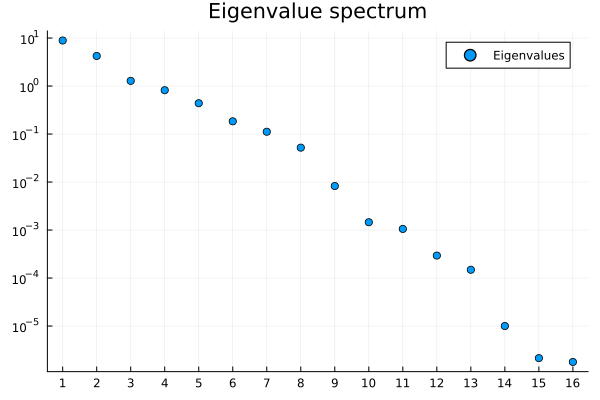

In [28]:
# Extracting data matrix
m = Matrix(df[:,begin:end-1])

# Centering and rescaling features
mean = Statistics.mean(m, dims=1)
std = Statistics.std(m, dims=1)
m_standardized = (m.-mean)./std;

# Computing the covariance matrix
c = (transpose(m_standardized)*m_standardized)/n

# Computing eigenvalues and eigenvectors
eig = eigen(c)
eigenvectors = eig.vectors[:, end:-1:begin] #reverse(eig.vectors)
eigenvalues = reverse(eig.values);

# Plotting the eigenvalue spectrum
plot(eigenvalues,
    seriestype=:scatter,
    label="Eigenvalues",
    xticks=1:length(eigenvalues),
    yscale=:log10,
    yticks=[10.0^i for i in ceil(log10(maximum(eigenvalues))):-1:floor(log10(minimum(eigenvalues)))],
    title = "Eigenvalue spectrum")

In [29]:
# Computing projection on principal components
pc = m_standardized*eigenvectors;

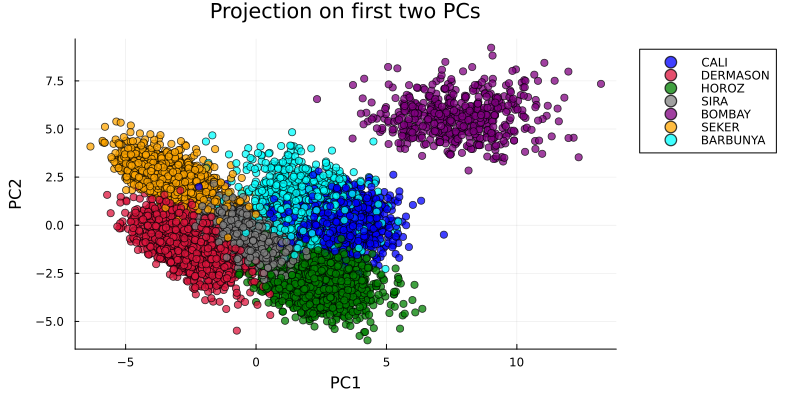

In [30]:
# Plotting data projected on first two principal components
distinguishable_colors = ("blue", "crimson", "green", "gray", "purple", "orange", "cyan")

classes = unique(df.Class)
color_dict = Dict(c => distinguishable_colors[i] for (i,c) in enumerate(classes))
colors = map(class -> color_dict[class], df.Class)

pc_plot = plot(
    pc[:, 1],
    pc[:, 2],
    color = colors,
    alpha=.75,
    xlabel="PC1",
    ylabel="PC2",
    seriestype=:scatter,
    title = "Projection on first two PCs",
    label=nothing
)


# The following is a trick done in order to show the legend
for class in classes
    indexes = (1:n)[df.Class .== class]

    plot!(
        pc[indexes[1:2], 1],
        pc[indexes[1:2], 2],
        color=color_dict[class],
        label = class,
        seriestype=:scatter,
        alpha=0.75,
        legend = :outertopright)
end

plot!(size=(800, 400), margin = 4mm)

pc_plot

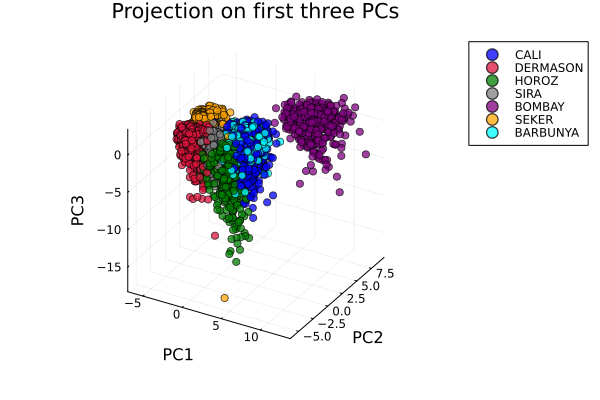

In [31]:
# Plotting data projected on first three principal components
distinguishable_colors = ("blue", "crimson", "green", "gray", "purple", "orange", "cyan")

classes = unique(df.Class)
color_dict = Dict(c => distinguishable_colors[i] for (i,c) in enumerate(classes))
colors = map(class -> color_dict[class], df.Class)

pc_plot = plot(
    pc[:, 1],
    pc[:, 2],
    pc[:, 3],
    color = colors,
    alpha=.75,
    xlabel="PC1",
    ylabel="PC2",
    zlabel="PC3",
    seriestype=:scatter,
    title = "Projection on first three PCs",
    label=nothing
)


# The following is a trick done in order to show the legend
for class in classes
    indexes = (1:n)[df.Class .== class]

    plot!(
        pc[indexes[1:2], 1],
        pc[indexes[1:2], 2],
        pc[indexes[1:2], 3],
        color=color_dict[class],
        label = class,
        seriestype=:scatter,
        alpha=0.75,
        legend = :outertopright)
end

pc_plot

In [32]:
# Saving an interactive 3d plot of the projection on the first three PCs (html) 

import PlotlyJS

plot_df = DataFrame(PC1=pc[:, 1], PC2=pc[:, 2], PC3=pc[:, 3], class=df.Class, color=colors)

pca_plot = PlotlyJS.plot(
    plot_df,
    x = :PC1,
    y = :PC2,
    z = :PC3,
    type = "scatter3d",
    labels=Dict(
        :PC1 => "PC1",
        :PC2 => "PC2",
        :PC3 => "PC3"
    ),
    color = :class,
    mode="markers",
    marker_size=1.5
)

open("./dry_beans_3d_pcs_plot.html", "w") do io
    PlotlyJS.PlotlyBase.to_html(io, pca_plot.plot)
end